<div style="color:#FF1F26;
           display:fill;
           border-style: solid;
           border-color:#C1C1C1;
           font-size:16px;
           font-family:Calibri;
           background-color:#B75351;">
<h2 style="text-align: center;
           padding: 10px;
           color:#FFFFFF;">
======= Plant Disease Classification using CNN & TransfearLearning with 95%+ Accuracy =======
</h2>
</div>


<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700"> Table of Contents</div>


<a id="toc"></a>

- [1. Setup](#1)
  - [1.1. Package and Library](#1.1)
  - [1.2. Load the Data](#1.2)
- [2. Data Explorations](#2)
- [3. Image Processing](#3)
- [4. Spliting](#4)
- [5. CNN Model](#5)
- [6. Transfear Learning](#6)
- [7. Evaluation](#7)
- [8. Predected Images](#8)


# <a id="1"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">1. Setup</div>


<a id="1.1"></a>

# <b><span style='color:#8D6D9B'>1.1. Package and Library</span></b>


In [1]:
import os
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import cv2 
import tensorflow as tf
import random
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report , confusion_matrix

from tqdm import tqdm
from keras.layers import Conv2D, MaxPooling2D , BatchNormalization ,Dropout ,Flatten , Dense , Input
from tensorflow.keras.applications import VGG16
from keras.models import Sequential

import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    
plt.style.use('ggplot')

ImportError: Traceback (most recent call last):
  File "c:\Users\sarth\AppData\Local\Programs\Python\Python313\Lib\site-packages\tensorflow\python\pywrap_tensorflow.py", line 58, in <module>
    from tensorflow.python.pywrap_tensorflow_internal import *
  File "c:\Users\sarth\AppData\Local\Programs\Python\Python313\Lib\site-packages\tensorflow\python\pywrap_tensorflow_internal.py", line 28, in <module>
    _pywrap_tensorflow_internal = swig_import_helper()
  File "c:\Users\sarth\AppData\Local\Programs\Python\Python313\Lib\site-packages\tensorflow\python\pywrap_tensorflow_internal.py", line 15, in swig_import_helper
    import imp
ModuleNotFoundError: No module named 'imp'


Failed to load the native TensorFlow runtime.

See https://www.tensorflow.org/install/errors

for some common reasons and solutions.  Include the entire stack trace
above this error message when asking for help.

<a id="1.2"></a>

# <b><span style='color:#8D6D9B'>1.2. Load The Data</span></b>


In [2]:
dataDir = 'datasets\corn'
selectedClasses = ['Blight',
                   'Common_Rust',
                   'Gray_Leaf_Spot',
                   'Healthy',]

In [3]:
imgPaths = []
labels = []
for className in os.listdir(dataDir):
    if className in selectedClasses :                  # Select you classes above
        classPath = os.path.join(dataDir,className)
        for img in os.listdir(classPath):
            imgPath = os.path.join(classPath,img)
            imgPaths.append(imgPath)
            labels.append(className)
            
# Convert the 2 lists to dataframe to easy use 
df = pd.DataFrame({
    'imgPath':imgPaths,
    'label':labels
})

df = df.sample(frac=1).reset_index(drop=True)            # Shuffle

df

,imgPath,label
0,/kaggle/input/plantdisease/PlantVillage/Potato...,Potato___Late_blight
1,/kaggle/input/plantdisease/PlantVillage/Pepper...,Pepper__bell___Bacterial_spot
2,/kaggle/input/plantdisease/PlantVillage/Potato...,Potato___Late_blight
3,/kaggle/input/plantdisease/PlantVillage/Potato...,Potato___Late_blight
4,/kaggle/input/plantdisease/PlantVillage/Potato...,Potato___Late_blight
...,...,...
6422,/kaggle/input/plantdisease/PlantVillage/Pepper...,Pepper__bell___healthy
6423,/kaggle/input/plantdisease/PlantVillage/Pepper...,Pepper__bell___healthy
6424,/kaggle/input/plantdisease/PlantVillage/Potato...,Potato___Early_blight
6425,/kaggle/input/plantdisease/PlantVillage/Potato...,Potato___Early_blight


In [4]:
len(df)

6427

# <a id="2"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">2. Data Explorations</div>


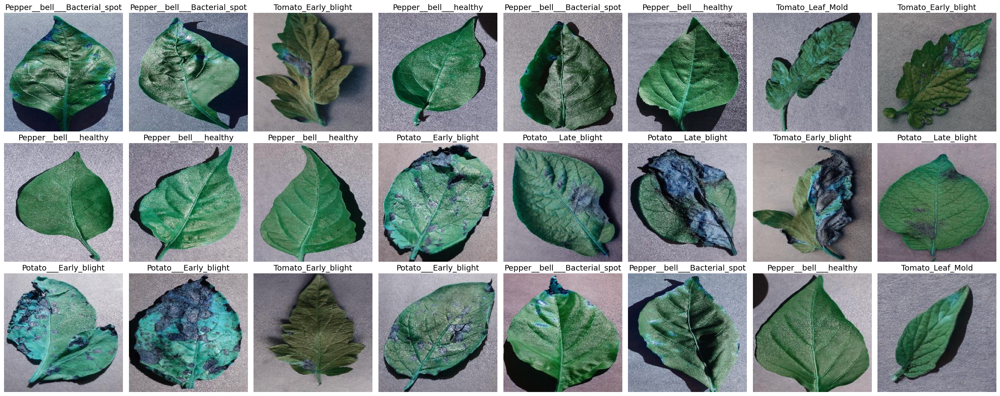

In [5]:
fig, axs = plt.subplots(3, 8, figsize=(25, 10))  # 3 rows, 5 columns

axs = axs.flatten()

for i in range(24):
    index = random.choice(df.index)
    imgPath = df.iloc[index]['imgPath']
    label = df.iloc[index]['label']
    img = cv2.imread(imgPath)
    axs[i].imshow(img)
    axs[i].set_title(label , fontsize=14)
    axs[i].axis('off')
    
plt.tight_layout()
plt.show()

# <a id="3"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">3. Image Processing</div>


In [6]:
df['label'] = df['label'].replace({'Healthy':0,
                                    'Blight':1,
                                    'Common_Rust':2,
                                    'Gray_Leaf_Spot':3,
                                    }).astype(int)

/tmp/ipykernel_1056/300140912.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['label'] = df['label'].replace({'Pepper__bell___Bacterial_spot':0 ,


In [7]:
IMG_SIZE = (150,150)   # to free some resources and reduce the execution time
imgs = []
for imgPath in tqdm(df['imgPath'], total=len(df)):
    img = cv2.imread(imgPath)
    img = cv2.cvtColor(img , cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, IMG_SIZE)
    imgs.append(img)

100%|██████████| 6427/6427 [00:10<00:00, 610.44it/s]


All the images has the same shape


In [8]:
# convert them to numpy array to we can split them 
images = np.array(imgs)
labels = np.array(df['label'])

len(images) , len(labels)

(6427, 6427)

In [9]:
images = images / 255.0         # normalize from 0 --> 255 to 0 --> 1  to reduce the execution time 

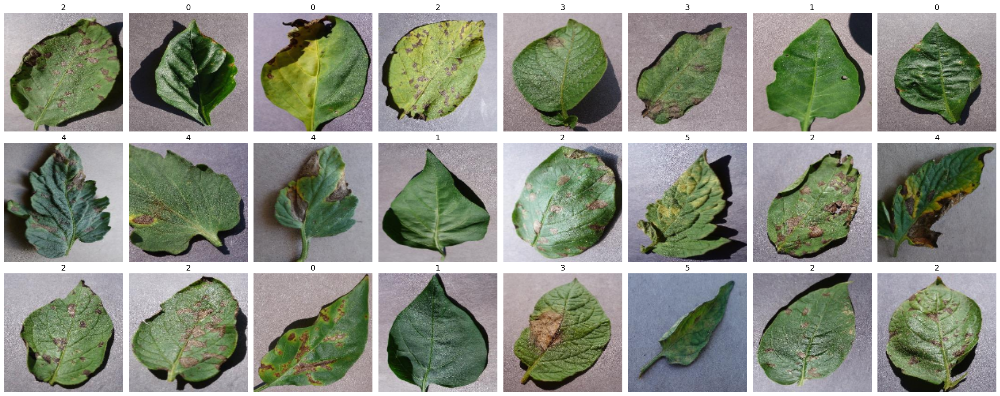

In [10]:
# Plot some images after encoding and resizing 
fig, axs = plt.subplots(3, 8, figsize=(25, 10))

axs = axs.flatten()

for i in range(24):
    index = random.choice(df.index)
    img = images[index]
    label = labels[index]
    axs[i].imshow(img)
    axs[i].set_title(label, fontsize=14)
    axs[i].axis('off')
    

plt.tight_layout()
plt.show()

# <a id="4"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">4. Spliting</div>


In [11]:
# Spliting 

X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42 ,shuffle=True)

print(f'Shape of X_train : {X_train.shape}')
print(f'Shape of X_test : {X_test.shape}')
print(f'Shape of y_train : {y_train.shape}')
print(f'Shape of y_test : {y_test.shape}')

Shape of X_train : (5141, 150, 150, 3)
Shape of X_test : (1286, 150, 150, 3)
Shape of y_train : (5141,)
Shape of y_test : (1286,)


# <a id="5"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">5. CNN Model</div>


In [12]:
with tf.device('/GPU:0'):
    kerasModel = Sequential([
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID' ,input_shape=(150,150,3)), # padding ='SAME' for using padding
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),

        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),

        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        Flatten(),

        Dense(128,activation='relu'),
        Dense(6 ,activation='softmax')
    ])

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [13]:
kerasModel.compile(optimizer='adam',loss='sparse_categorical_crossentropy' ,metrics=['accuracy'])

In [14]:
history = kerasModel.fit(X_train,y_train,
                         validation_split = 0.2 , #validation_data=(X_test,y_test),
                         epochs=50,
                         batch_size=50, 
                         verbose=1,
                         callbacks=[tf.keras.callbacks.EarlyStopping(
                                            patience=5,
                                            monitor='val_accuracy',
                                            restore_best_weights=True)])

Epoch 1/50


I0000 00:00:1725835874.547794    1104 service.cc:145] XLA service 0x78a06c001840 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1725835874.547841    1104 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


12/83 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.2965 - loss: 1.6828

I0000 00:00:1725835884.093988    1104 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


83/83 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - accuracy: 0.5462 - loss: 1.1548 - val_accuracy: 0.1652 - val_loss: 6.4932
Epoch 2/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.7904 - loss: 0.5783 - val_accuracy: 0.1652 - val_loss: 9.5973
Epoch 3/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.8386 - loss: 0.4420 - val_accuracy: 0.1652 - val_loss: 13.3953
Epoch 4/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.8509 - loss: 0.4155 - val_accuracy: 0.1652 - val_loss: 9.0673
Epoch 5/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.8874 - loss: 0.3087 - val_accuracy: 0.2196 - val_loss: 5.2319
Epoch 6/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9066 - loss: 0.2734 - val_accuracy: 0.5063 - val_loss: 1.6773
Epoch 7/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9109 - loss: 0.2688 - val_accuracy: 0.4898 - val_loss: 1.5677
Epoch 8/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9261 - loss: 0.2162 - val_accuracy: 0.8202 - val_loss:

In [15]:
y_pred = kerasModel.predict(X_test)

41/41 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step


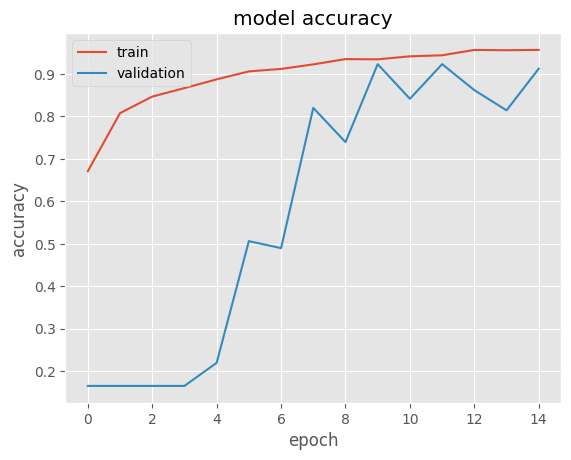

In [16]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [17]:
y_test[:10]

array([0, 0, 2, 4, 2, 1, 0, 2, 3, 3])

In [18]:
new_y_pred = [np.argmax(x) for x in y_pred]
new_y_pred[:10]

[2, 0, 2, 5, 2, 1, 0, 2, 3, 2]

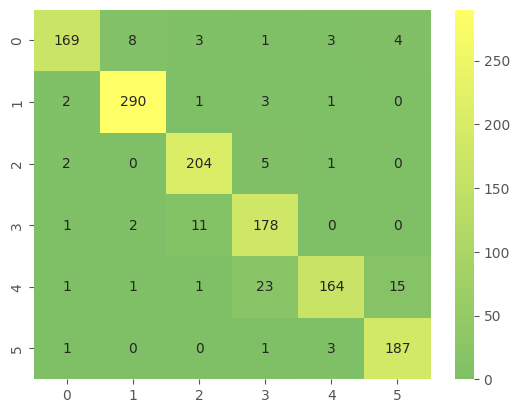

In [19]:
CM = confusion_matrix(y_test, new_y_pred)
sns.heatmap(CM, center = True,cmap='summer',annot=True ,fmt='.5g')
plt.show()

In [20]:
ClassificationReport = classification_report(y_test,new_y_pred)
print('Classification Report is : \n', ClassificationReport )

Classification Report is : 
               precision    recall  f1-score   support

           0       0.96      0.90      0.93       188
           1       0.96      0.98      0.97       297
           2       0.93      0.96      0.94       212
           3       0.84      0.93      0.88       192
           4       0.95      0.80      0.87       205
           5       0.91      0.97      0.94       192

    accuracy                           0.93      1286
   macro avg       0.93      0.92      0.92      1286
weighted avg       0.93      0.93      0.93      1286



# <a id="6"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">6. Transfear Learning</div>


We will use VGG16 pretrained model


In [21]:
custom_input = Input(shape=(150, 150, 3))           # To customize the input shape of PreTrained model  

with tf.device('/GPU:0'):          # to use GPU
    Model = Sequential([

        VGG16(weights='imagenet', include_top=False, input_tensor=custom_input),
        
        Flatten(),                                     # because we ignore the flatten and dense layers when include_top = False 
        
        Dense(128,activation='relu'),
        
        Dropout(0.2),

        Dense(6 ,activation='softmax')
    ])

In [22]:
VGG16Layers = Model.layers[0]
for layer in VGG16Layers.layers[1:-3]:           # freez all layers except the first and last 3 layers, we will make them trainable (weghts changes with training)
    layer.trainable = False

In [23]:
Model.compile(optimizer='adam',loss='sparse_categorical_crossentropy' ,metrics=['accuracy'])

In [24]:
history = Model.fit(X_train,y_train,
                         validation_split = 0.2 , #validation_data=(X_test,y_test),
                         epochs=50,
                         batch_size=100, 
                         verbose=1,
                         callbacks=[tf.keras.callbacks.EarlyStopping(
                                            patience=5,
                                            monitor='val_accuracy',
                                            restore_best_weights=True)])

Epoch 1/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 30s 361ms/step - accuracy: 0.4398 - loss: 1.5901 - val_accuracy: 0.8154 - val_loss: 0.4505
Epoch 2/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - accuracy: 0.8393 - loss: 0.4431 - val_accuracy: 0.9106 - val_loss: 0.2640
Epoch 3/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - accuracy: 0.9200 - loss: 0.2227 - val_accuracy: 0.9223 - val_loss: 0.2236
Epoch 4/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - accuracy: 0.9374 - loss: 0.1560 - val_accuracy: 0.8970 - val_loss: 0.3237
Epoch 5/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - accuracy: 0.9635 - loss: 0.1043 - val_accuracy: 0.8776 - val_loss: 0.3919
Epoch 6/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - accuracy: 0.9491 - loss: 0.1324 - val_accuracy: 0.9456 - val_loss: 0.1487
Epoch 7/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - accuracy: 0.9707 - loss: 0.0766 - val_accuracy: 0.9553 - val_loss: 0.1394
Epoch 8/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - accuracy: 0.9863 - loss: 0.0360 - val_accuracy: 

In [25]:
Model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,302,356 (104.15 MB)

 Trainable params: 5,769,094 (22.01 MB)

 Non-trainable params: 9,995,072 (38.13 MB)

 Optimizer params: 11,538,190 (44.01 MB)

# <a id="7"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">7. Evaluation</div>


In [26]:
y_pred = Model.predict(X_test)

41/41 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step


In [27]:
print(f'Prediction items : \n{y_pred[:5]}')

Prediction items : 
[[1.6096719e-01 8.3791643e-01 9.0944202e-04 7.9560385e-05 9.7987941e-05
  2.9233815e-05]
 [9.9654418e-01 3.4064357e-03 6.5371005e-06 2.0057876e-05 2.2099674e-05
  7.0452444e-07]
 [1.7104599e-11 5.3295475e-17 1.0000000e+00 2.0029369e-11 6.7394419e-13
  1.1354412e-16]
 [2.7269352e-14 3.8430795e-18 5.0978027e-14 8.7514563e-15 9.9968737e-01
  3.1261076e-04]
 [9.4825085e-11 2.5068584e-13 1.0000000e+00 3.1336240e-09 4.8034421e-10
  9.4917639e-13]]


In [28]:
print(f'Prediction items after rounding :  \n{np.round(y_pred[:5])}')

Prediction items after rounding :  
[[0. 1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 0. 0.]]


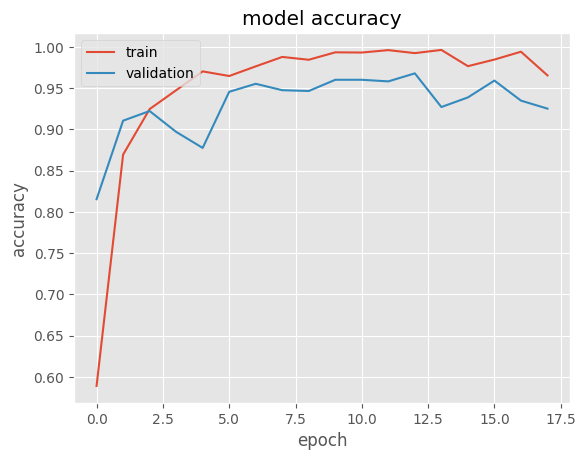

In [29]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [30]:
y_test[:10]

array([0, 0, 2, 4, 2, 1, 0, 2, 3, 3])

In [31]:
new_y_pred = [np.argmax(x) for x in y_pred]
new_y_pred[:10]

[1, 0, 2, 4, 2, 1, 0, 2, 3, 3]

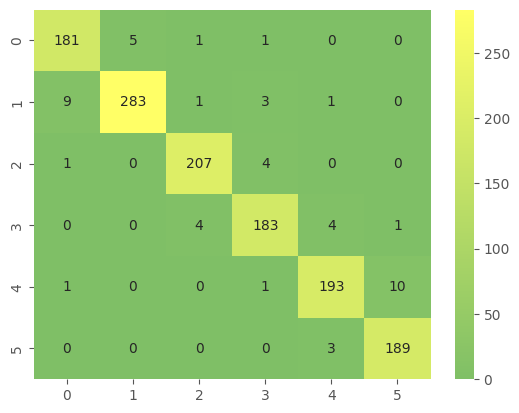

In [32]:
CM = confusion_matrix(y_test, new_y_pred)
sns.heatmap(CM, center = True,cmap='summer',annot=True ,fmt='.5g')
plt.show()

In [33]:
ClassificationReport = classification_report(y_test,new_y_pred)
print('Classification Report is : \n', ClassificationReport )

Classification Report is : 
               precision    recall  f1-score   support

           0       0.94      0.96      0.95       188
           1       0.98      0.95      0.97       297
           2       0.97      0.98      0.97       212
           3       0.95      0.95      0.95       192
           4       0.96      0.94      0.95       205
           5       0.94      0.98      0.96       192

    accuracy                           0.96      1286
   macro avg       0.96      0.96      0.96      1286
weighted avg       0.96      0.96      0.96      1286



# <a id="8"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">8. Predected Images</div>


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 777ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


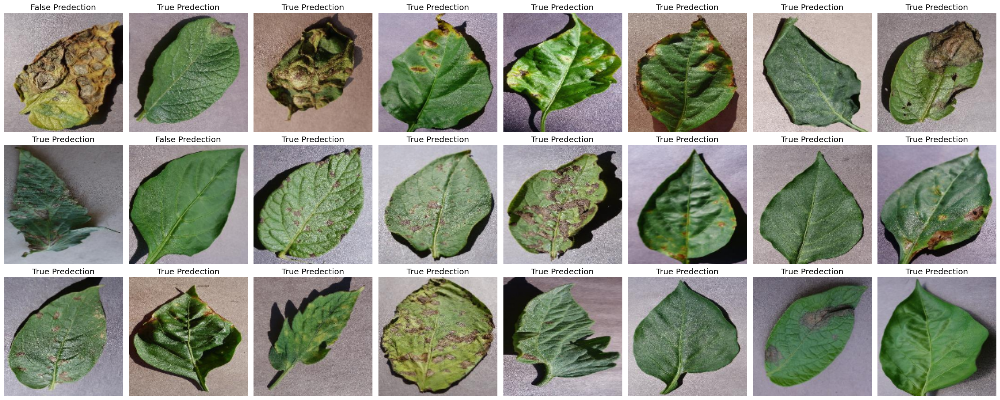

In [34]:
# Plot some images after encoding and resizing 
fig, axs = plt.subplots(3, 8, figsize=(25, 10))

axs = axs.flatten()

for i in range(24):
    index = random.choice(range(len(X_test)))
    img = X_test[index]
    label = y_test[index]
    reshapedImg = img.reshape(1,150,150,3)
    pred = np.argmax(Model.predict(reshapedImg))
    isPredectedTrue = 'True' if (label == pred) else 'False'
    axs[i].imshow(img)
    axs[i].set_title(f'{isPredectedTrue} Predection')
    axs[i].axis('off')
    
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)
plt.show()

### If these kernels impress you,give them an <font size="+3" color="red"><b>Upvote</b></font>.<br>


<a href="#toc" class="btn btn-success btn-lg active" role="button" aria-pressed="true" style="color:white" data-toggle="popover" title="go to Colors">Go to TOP</a>
